PROJETO ACIDENTES NA CIDADE DE PORTO ALEGRE

DEFINICAO DE ENTREGA DO PROJETO:
- VISUALIZACAO EM MAPA DOS ACIDENTES X
- GRAFICO DAS RUAS COM MAIS ACIDENTES X
- EVOLUCAO DOS ACIDENTES POR ANO X
- DIAS DA SEMANA COM MAIS ACIDENTE X
- HORARIO COM MAIS ACIDENTES X
- TIPOS DE ACIDENTES X
- QUANTIDADE DE ACIDENTES POR TIPO DE VEICULO X

In [1]:
import pandas as pd
df_raw = pd.read_csv('C:/Users/caiol/Documents/Python Scripts/Projeto_ciencia_dados_acidentes/cat_acidentes.csv', sep=';')

In [2]:
#LIMPEZA DOS DADOS QUE ESTAO SEM LATITUDE OU LONGITUDE

def limpeza_dados():
  df_resultado = df_raw.dropna(subset=['latitude', 'longitude'])
  verify_lon = (df_resultado['longitude'] < -51) & (df_resultado['longitude'] > -52)
  verify_lat = (df_resultado['latitude'] < -30) & (df_resultado['latitude'] > -31)
  df_resultado = df_resultado[verify_lon]
  df = df_resultado[verify_lat]
  return df

df = limpeza_dados()


C:\Users\caiol\AppData\Local\Temp\ipykernel_9436\1051004542.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df = df_resultado[verify_lat]


In [3]:
# VISUALIZACAO EM MAPA DOS ACIDENTES
import folium 
from folium.plugins import MarkerCluster, HeatMap

mapa = folium.Map(lacation=(-30.1, -51.15), zoom_start=11)
coordenadas = list(zip(df.latitude, df.longitude))

# MAPA DE CALOR
# mapa_calor = HeatMap(coordenadas, radius=9, blur=10)
# mapa.add_child(mapa_calor)

# MAPA CLUSTERIZADO 
mapa_cluster = MarkerCluster(coordenadas)
mapa.add_child(mapa_cluster)

mapa

<function matplotlib.pyplot.show(close=None, block=None)>

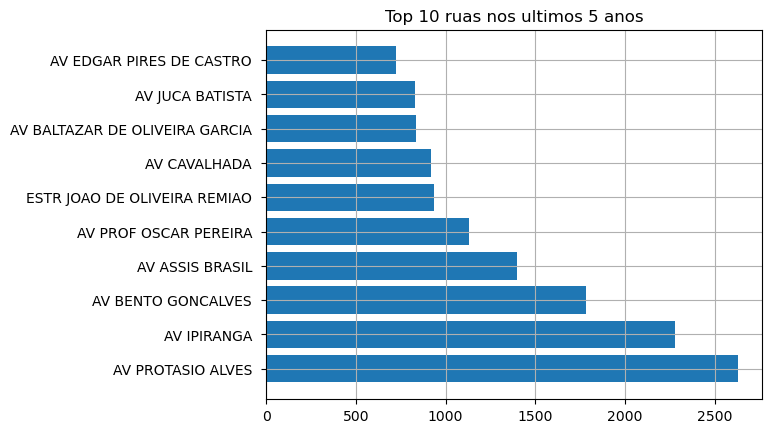

In [ ]:
# GRAFICO DAS RUAS COM MAIS ACIDENTES
import matplotlib.pyplot as plt

df_ruas = df['log1'].value_counts().sort_values(ascending= False)
df_ruas = df_ruas.head(10)
# print(df_ruas.index)

plt.barh(df_ruas.index, df_ruas.values)
plt.title('Top 10 ruas nos ultimos 5 anos')
plt.grid(True)
plt.show


<function matplotlib.pyplot.show(close=None, block=None)>

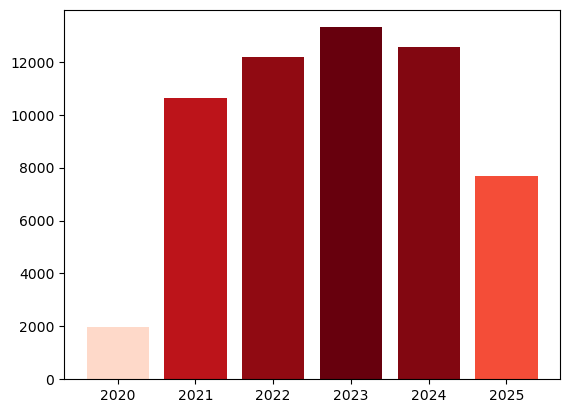

In [5]:
# EVOLUCAO DOS ACIDENTES POR ANO
import matplotlib.pyplot as plt

df['data'] = pd.to_datetime(df['data'], errors='coerce')
df_ano = df['data'].dt.year.value_counts()

gradiente = df_ano/df_ano.max()
cores = plt.cm.Reds(gradiente)

plt.bar(df_ano.index, df_ano.values, color = cores)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

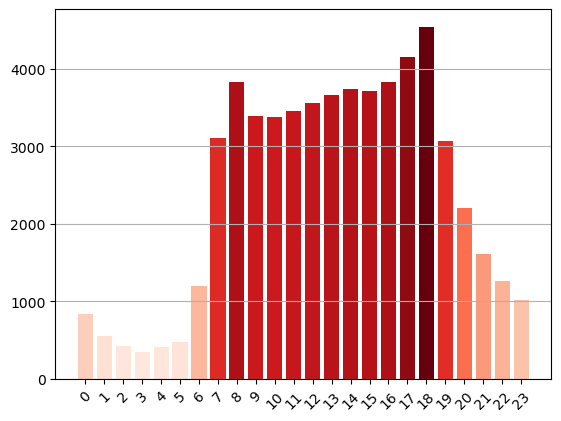

In [6]:
# HORARIO COM MAIS ACIDENTES
import matplotlib.pyplot as plt

df['hora'] = pd.to_datetime(df['hora'], errors='coerce')
df_hora = df['hora'].dt.hour.value_counts()

gradiente_acidente_hora = df_hora/df_hora.max()
cores = plt.cm.Reds(gradiente_acidente_hora)

plt.bar(df_hora.index, df_hora.values, color = cores)
plt.xticks(rotation=45, ticks=range(len(df_hora)))
plt.grid(axis='y')
plt.show



<function matplotlib.pyplot.show(close=None, block=None)>

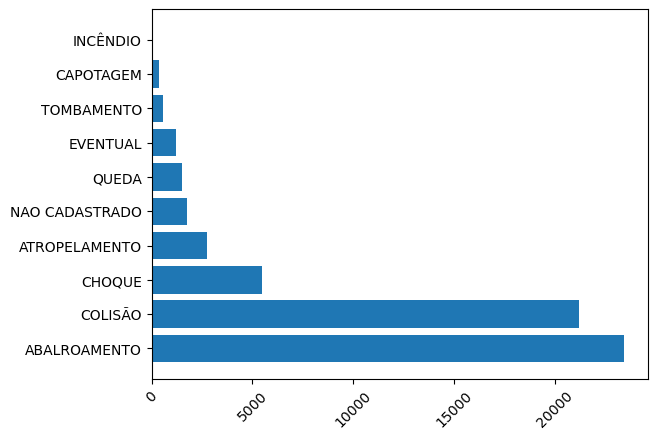

In [72]:
# TIPOS DE ACIDENTES
import matplotlib.pyplot as plt

df_tipo_acidentes = df['tipo_acid'].value_counts()
df_tipo_acidentes

plt.barh(df_tipo_acidentes.index, df_tipo_acidentes.values)
plt.xticks(rotation=45)
plt.show

C:\Users\caiol\AppData\Local\Temp\ipykernel_9436\1051004542.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df = df_resultado[verify_lat]


<function matplotlib.pyplot.show(close=None, block=None)>

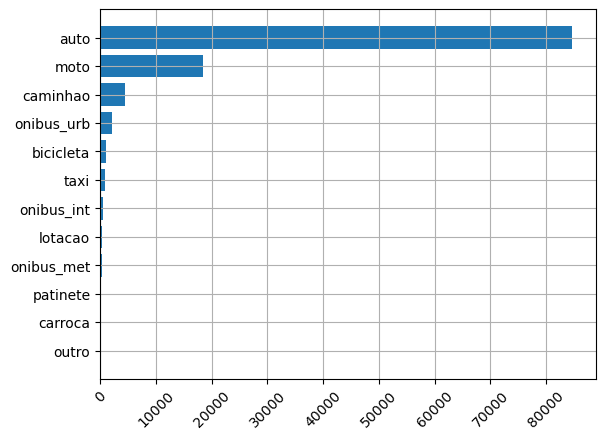

In [52]:
# QUANTIDADE DE ACIDENTES POR TIPO DE VEICULO
import matplotlib.pyplot as plt

df = limpeza_dados()
df['data'] = pd.to_datetime(df['data'], errors='coerce')

df_veiculos = df[["auto", "taxi", "lotacao", "onibus_urb", "onibus_met", "onibus_int", "caminhao", "moto", "carroca", "bicicleta", "outro", "patinete"]].sum().sort_values()

plt.barh(df_veiculos.index, df_veiculos.values)
plt.xticks(rotation=45)
plt.grid(True)
plt.show